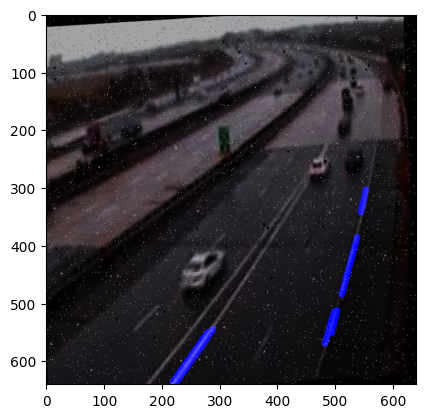

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Function to preprocess image
def preprocess_image(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    blur = cv2.GaussianBlur(gray, (5, 5), 0)
    return blur

# Function to detect edges
def detect_edges(image):
    edges = cv2.Canny(image, 50, 150)
    return edges

# Function to define region of interest
def region_of_interest(image):
    height = image.shape[0]
    polygons = np.array([[(200, height), (1100, height), (550, 250)]])
    mask = np.zeros_like(image)
    cv2.fillPoly(mask, polygons, 255)
    masked_image = cv2.bitwise_and(image, mask)
    return masked_image

# Function to detect lines using Hough Transform
def detect_lines(image):
    lines = cv2.HoughLinesP(image, 2, np.pi / 180, 100, minLineLength=40, maxLineGap=5)
    return lines

# Function to display lines on the image
def display_lines(image, lines):
    line_image = np.zeros_like(image)
    if lines is not None:
        for line in lines:
            x1, y1, x2, y2 = line.reshape(4)
            cv2.line(line_image, (x1, y1), (x2, y2), (255, 0, 0), 10)
    return line_image

# Function to process image
def process_image(image):
    blurred_image = preprocess_image(image)
    edges = detect_edges(blurred_image)
    cropped_edges = region_of_interest(edges)
    lines = detect_lines(cropped_edges)
    line_image = display_lines(image, lines)
    combo_image = cv2.addWeighted(image, 0.8, line_image, 1, 1)
    return combo_image

# Main function to process video
def process_video(video_path):
    cap = cv2.VideoCapture(video_path)
    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break
        result_frame = process_frame(frame)
        cv2.imshow('result', result_frame)
        if cv2.waitKey(1) & 0xFF == ord('q'):
            break
    cap.release()
    cv2.destroyAllWindows()

# Function to process a frame (for video processing)
def process_frame(frame):
    result_image = process_image(frame)
    return result_image

# Example usage with an image
image = cv2.imread('/content/roadlane.jpg')
result_image = process_image(image)

# Convert BGR image to RGB for displaying with matplotlib
result_image_rgb = cv2.cvtColor(result_image, cv2.COLOR_BGR2RGB)
plt.imshow(result_image_rgb)
plt.show()

# Example usage with a video
# process_video('path_to_your_video.mp4')


In [ ]:
pip install youtube-dl

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 34.7 MB/s eta 0:00:00


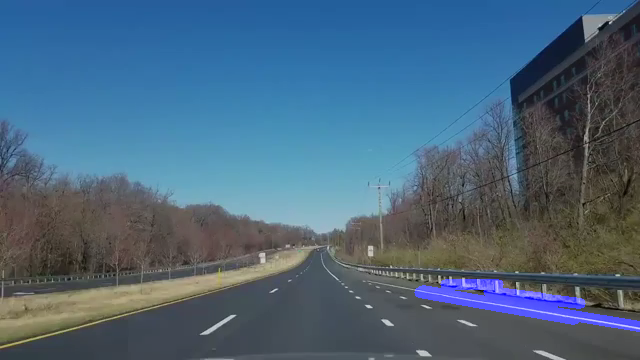

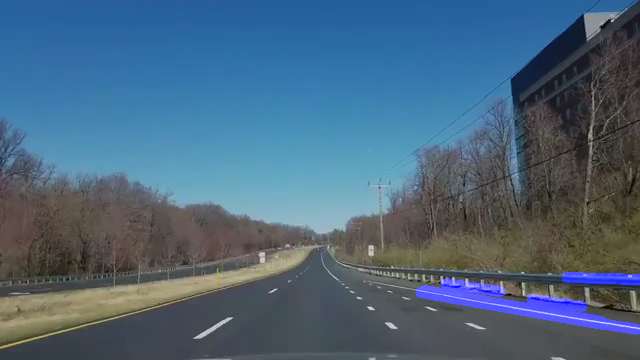

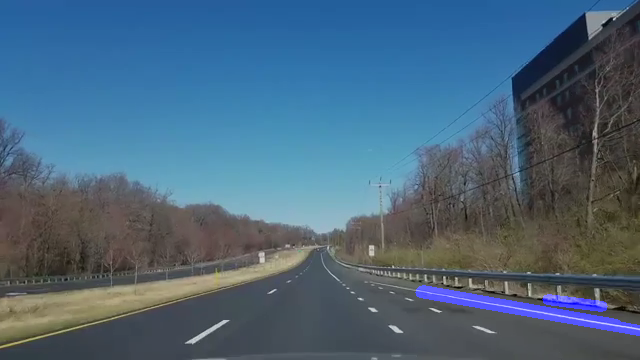

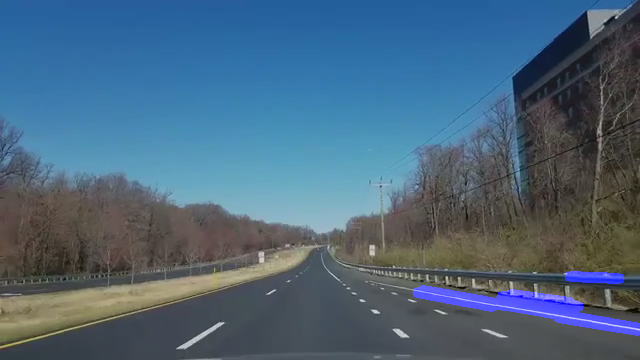

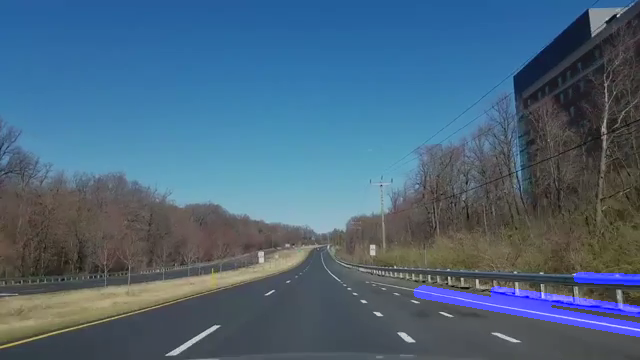

...

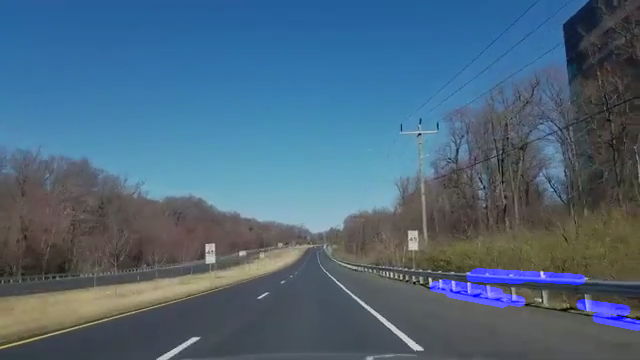

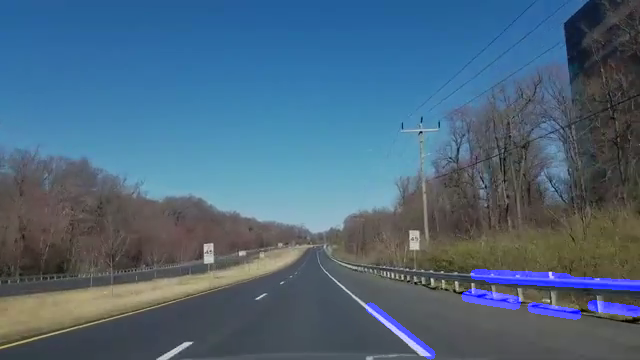

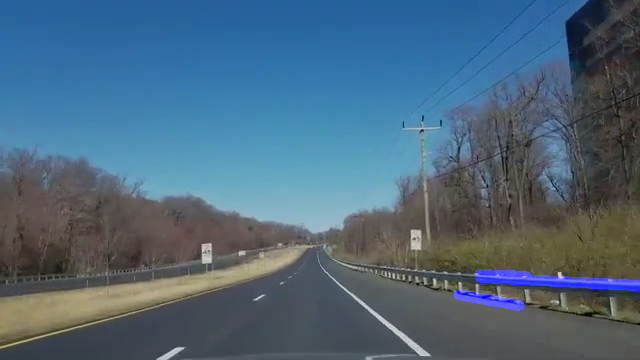

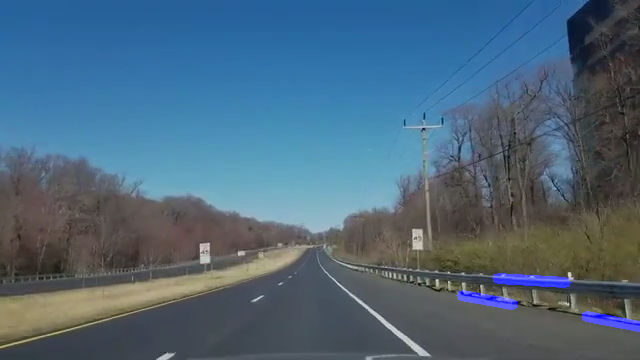

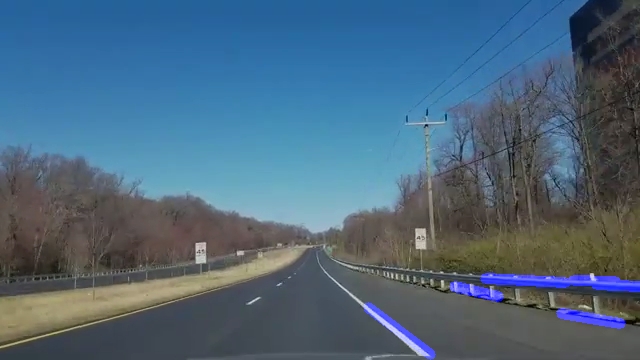

In [2]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

# Preprocess the image
def preprocess_image(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    blur = cv2.GaussianBlur(gray, (5, 5), 0)
    return blur

# Detect edges in the image
def detect_edges(image):
    edges = cv2.Canny(image, 50, 150)
    return edges

# Define region of interest
def region_of_interest(image):
    height = image.shape[0]
    polygons = np.array([[(200, height), (1100, height), (550, 250)]])
    mask = np.zeros_like(image)
    cv2.fillPoly(mask, polygons, 255)
    masked_image = cv2.bitwise_and(image, mask)
    return masked_image

# Detect lines using Hough Transform
def detect_lines(image):
    lines = cv2.HoughLinesP(image, 2, np.pi / 180, 100, minLineLength=40, maxLineGap=5)
    return lines

# Display lines on the image
def display_lines(image, lines):
    line_image = np.zeros_like(image)
    if lines is not None:
        for line in lines:
            x1, y1, x2, y2 = line.reshape(4)
            cv2.line(line_image, (x1, y1), (x2, y2), (255, 0, 0), 10)
    return line_image

# Process the image
def process_image(image):
    blurred_image = preprocess_image(image)
    edges = detect_edges(blurred_image)
    cropped_edges = region_of_interest(edges)
    lines = detect_lines(cropped_edges)
    line_image = display_lines(image, lines)
    combo_image = cv2.addWeighted(image, 0.8, line_image, 1, 1)
    return combo_image

# Process a video file
def process_video(video_path):
    cap = cv2.VideoCapture(video_path)
    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break
        result_frame = process_image(frame)
        cv2_imshow(result_frame)  # Use cv2_imshow instead of cv2.imshow
        if cv2.waitKey(1) & 0xFF == ord('q'):
            break
    cap.release()
    cv2.destroyAllWindows()

# Path to your video file
video_path = '/content/roadlanevideo.mp4'
process_video(video_path)
